# housing/rent/apartment monthly usd price

In [1]:
import numpy as np

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import KFold
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA

import cupy as cp
from cuml.cluster import KMeans, DBSCAN
from cuml.metrics.cluster import silhouette_score
from cuml.svm import SVR as cuSVR
from cuml.linear_model import LinearRegression as cuLinearRegression
from cuml.ensemble import RandomForestRegressor as cuRandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

import shap

In [2]:
pd.set_option('display.max_columns', None)

# Data Analysis

In [3]:
df = pd.read_csv('/kaggle/input/apartment-rent-data/apartments_for_rent_classified_100K/apartments_for_rent_classified_100K.csv', sep=";", encoding='cp1252', low_memory=False)
df

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,pets_allowed,price,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
0,5668640009,housing/rent/apartment,One BR 507 & 509 Esplanade,"This unit is located at 507 & 509 Esplanade, R...",NaN,1.0,1.0,USD,No,Thumbnail,Cats,2195.0,"$2,195",Monthly,542,507 509 Esplanade,Redondo Beach,CA,33.8520,-118.3759,RentLingo,1577360355
1,5668639818,housing/rent/apartment,Three BR 146 Lochview Drive,"This unit is located at 146 Lochview Drive, Ne...",NaN,1.5,3.0,USD,No,Thumbnail,"Cats,Dogs",1250.0,"$1,250",Monthly,1500,146 Lochview Dr,Newport News,VA,37.0867,-76.4941,RentLingo,1577360340
2,5668639686,housing/rent/apartment,Three BR 3101 Morningside Drive,This unit is located at 3101 Morningside Drive...,NaN,2.0,3.0,USD,No,Thumbnail,NaN,1395.0,"$1,395",Monthly,1650,3101 Morningside Dr,Raleigh,NC,35.8230,-78.6438,RentLingo,1577360332
3,5668639659,housing/rent/apartment,Two BR 209 Aegean Way,"This unit is located at 209 Aegean Way, Vacavi...",NaN,1.0,2.0,USD,No,Thumbnail,"Cats,Dogs",1600.0,"$1,600",Monthly,820,209 Aegean Way,Vacaville,CA,38.3622,-121.9712,RentLingo,1577360330
4,5668639374,housing/rent/apartment,One BR 4805 Marquette NE,"This unit is located at 4805 Marquette NE, Alb...",NaN,1.0,1.0,USD,No,Thumbnail,"Cats,Dogs",975.0,$975,Monthly,624,4805 Marquette NE,Albuquerque,NM,35.1038,-106.6110,RentLingo,1577360308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99487,5121219946,housing/rent/apartment,Houston - superb Apartment nearby fine dining,"Redefining urban living, in southeast Houston,...","Gym,Parking,Patio/Deck,Playground,Storage,Wood...",1.0,1.0,USD,No,Yes,NaN,780.0,$780,Monthly,605,NaN,Houston,TX,29.6151,-95.1998,RentDigs.com,1544185770
99488,5121219696,housing/rent/apartment,The Best of the Best in the City of Jacksonvil...,Courtney Manor Apartments offer the best of ev...,"AC,Cable or Satellite,Clubhouse,Dishwasher,Gym...",2.0,2.0,USD,No,Yes,"Cats,Dogs",813.0,$813,Monthly,921,NaN,Jacksonville,FL,30.2254,-81.7579,RentDigs.com,1544185750
99489,5121219420,housing/rent/apartment,A great & large One BR apartment. Pet OK!,"Fully remodeled, new floor, kitchen cabinet, s...","Garbage Disposal,Refrigerator",1.0,1.0,USD,No,Yes,"Cats,Dogs",1325.0,"$1,325",Monthly,650,NaN,San Diego,CA,32.7379,-117.0914,RentDigs.com,1544185729
99490,5121218935,housing/rent/apartment,"The Crest offers studio, 1, 2 & Three BR homes...","Amenities include a fitness facilities, swimmi...","Gym,Pool",1.0,1.0,USD,No,Yes,"Cats,Dogs",931.0,$931,Monthly,701,NaN,Huntersville,NC,35.4158,-80.8451,RentDigs.com,1544185670


"id" column should be dropped

"amenities" and "pets_allowed" are multi-label or multi-valued feature. So these features should be split.

As there is already cleaned "price" feature present there is no need for raw "price_display" feature.

"price" should be based on monthly 'price_display' for the sake of prediction

"bathrooms" and "bedrooms" column seems to have float number which is not possible to I will use the lower interger. Eg: if bedroom 1.5 then new value will be 1.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             99492 non-null  int64  
 1   category       99492 non-null  object 
 2   title          99492 non-null  object 
 3   body           99492 non-null  object 
 4   amenities      83448 non-null  object 
 5   bathrooms      99429 non-null  float64
 6   bedrooms       99368 non-null  float64
 7   currency       99492 non-null  object 
 8   fee            99492 non-null  object 
 9   has_photo      99492 non-null  object 
 10  pets_allowed   39068 non-null  object 
 11  price          99491 non-null  float64
 12  price_display  99491 non-null  object 
 13  price_type     99492 non-null  object 
 14  square_feet    99492 non-null  int64  
 15  address        7943 non-null   object 
 16  cityname       99190 non-null  object 
 17  state          99190 non-null  object 
 18  latitu

In [5]:
df.describe()

,id,bathrooms,bedrooms,price,square_feet,latitude,longitude,time
count,9.949200e+04,99429.000000,99368.000000,99491.000000,99492.000000,99467.000000,99467.000000,9.949200e+04
mean,5.358321e+09,1.445323,1.728212,1527.057281,956.430688,36.947988,-91.568656,1.559665e+09
std,1.847404e+08,0.547021,0.749200,904.245882,417.571522,4.599461,15.817168,1.105077e+07
min,5.121046e+09,1.000000,0.000000,100.000000,101.000000,19.573800,-159.369800,1.544174e+09
25%,5.197950e+09,1.000000,1.000000,1013.000000,729.000000,33.746500,-104.791900,1.550832e+09
50%,5.508673e+09,1.000000,2.000000,1350.000000,900.000000,37.228200,-84.562300,1.568745e+09
75%,5.509007e+09,2.000000,2.000000,1795.000000,1115.000000,39.953000,-77.608200,1.568767e+09
max,5.669439e+09,9.000000,9.000000,52500.000000,50000.000000,64.833200,-68.778800,1.577391e+09


In [6]:
df.describe(include='object')

,category,title,body,amenities,currency,fee,has_photo,pets_allowed,price_display,price_type,address,cityname,state,source
count,99492,99492,99492,83448,99492,99492,99492,39068,99491,99492,7943,99190,99190,99492
unique,7,58503,94503,9827,1,2,3,4,3718,3,7771,2979,51,25
top,housing/rent/apartment,Apartment in great location,"When searching for a pet-friendly One-, Two- a...",Parking,USD,No,Yes,"Cats,Dogs","$1,350",Monthly,8215 S.W 72nd Avenue,Dallas,TX,RentDigs.com
freq,99431,1064,43,6188,99492,99291,55974,37097,574,99488,19,2858,11257,90912


In [7]:
# Missing values 
df.isnull().sum()

id                   0
category             0
title                0
body                 0
amenities        16044
bathrooms           63
bedrooms           124
currency             0
fee                  0
has_photo            0
pets_allowed     60424
price                1
price_display        1
price_type           0
square_feet          0
address          91549
cityname           302
state              302
latitude            25
longitude           25
source               0
time                 0
dtype: int64

In [8]:
# Missing values percentage
(df.isnull().sum()/df.shape[0])*100

id                0.000000
category          0.000000
title             0.000000
body              0.000000
amenities        16.125920
bathrooms         0.063322
bedrooms          0.124633
currency          0.000000
fee               0.000000
has_photo         0.000000
pets_allowed     60.732521
price             0.001005
price_display     0.001005
price_type        0.000000
square_feet       0.000000
address          92.016444
cityname          0.303542
state             0.303542
latitude          0.025128
longitude         0.025128
source            0.000000
time              0.000000
dtype: float64

"address" column is almost empty. It is better to remove this column.

"amneties" and "pets_allowed" columns missing values can be handled by replacing them with a placeholder text like "missing"

"bedrooms" and "bathrooms" columns missing values can be replaced by median

rest of the feature missing values rows should be removed

In [9]:
for feat in df.select_dtypes('object'):
    print(f'"{feat}" has {len(df[feat].unique())} unique values or {(len(df[feat].unique())/df.shape[0])*100:.2f}% of total values')

"category" has 7 unique values or 0.01% of total values
"title" has 58503 unique values or 58.80% of total values
"body" has 94503 unique values or 94.99% of total values
"amenities" has 9828 unique values or 9.88% of total values
"currency" has 1 unique values or 0.00% of total values
"fee" has 2 unique values or 0.00% of total values
"has_photo" has 3 unique values or 0.00% of total values
"pets_allowed" has 5 unique values or 0.01% of total values
"price_display" has 3719 unique values or 3.74% of total values
"price_type" has 3 unique values or 0.00% of total values
"address" has 7772 unique values or 7.81% of total values
"cityname" has 2980 unique values or 3.00% of total values
"state" has 52 unique values or 0.05% of total values
"source" has 25 unique values or 0.03% of total values


"title" and "body" features have high unique value which won't help in predicting prices. It should be removed.

"currency" column has only 1 unique value. Better to remove it.

"fee" column is binary. It should be modified as such.

"source" should be removed as for prediction purpose source won't be required.

In [10]:
for feat in ["category", "fee", "has_photo", "pets_allowed", "price_type", "source"]:
    print(f'\nFeature "{feat}" unique values:')
#     print(df[feat].unique().tolist())
    print(df[feat].value_counts())


Feature "category" unique values:
category
housing/rent/apartment            99431
housing/rent/commercial/retail       42
housing/rent                          7
housing/rent/short_term               4
housing/rent/home                     4
housing/rent/condo                    3
housing/rent/other                    1
Name: count, dtype: int64

Feature "fee" unique values:
fee
No     99291
Yes      201
Name: count, dtype: int64

Feature "has_photo" unique values:
has_photo
Yes          55974
Thumbnail    34303
No            9215
Name: count, dtype: int64

Feature "pets_allowed" unique values:
pets_allowed
Cats,Dogs         37097
Cats               1843
Dogs                127
Cats,Dogs,None        1
Name: count, dtype: int64

Feature "price_type" unique values:
price_type
Monthly           99488
Weekly                3
Monthly|Weekly        1
Name: count, dtype: int64

Feature "source" unique values:
source
RentDigs.com         90912
RentLingo             6924
ListedBuy            

Seems above features have some values with low cardinality. I will remove rows which has value counts less than 100. This means "price_type" feature will have only "Monthly" value and "category" feature will have only "housing/rent/apartment" value. So, after mentioned filtering, both these column should be removed also.

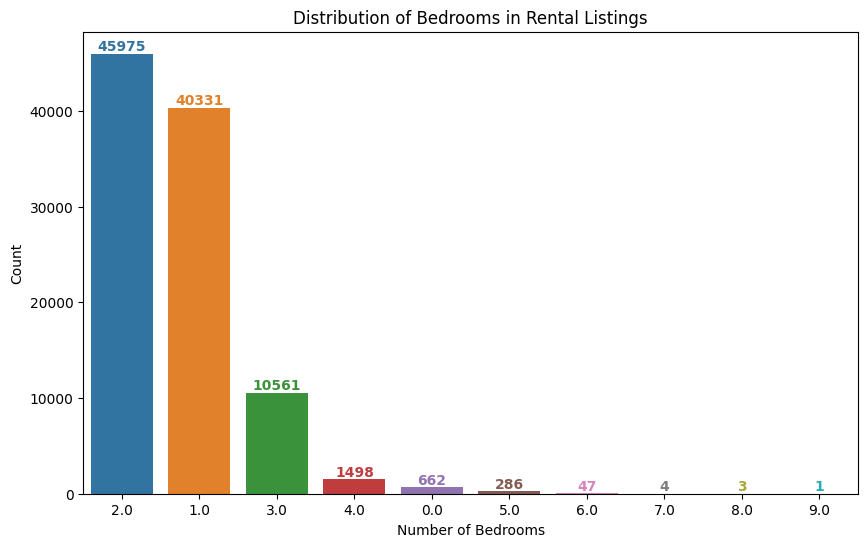

In [11]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='bedrooms', order=df['bedrooms'].value_counts().index)

# Add counts to each bar with the same color as the bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', 
                fontsize=10, color=p.get_facecolor(),  # Match text color to bar color
                weight='bold')  # Make the text bold for better readability

# Add labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title('Distribution of Bedrooms in Rental Listings')

# Show the plot
plt.show()

rows with bedrooms greater than 6 should be removed as there is less values counts of bedrooms for those entries. 

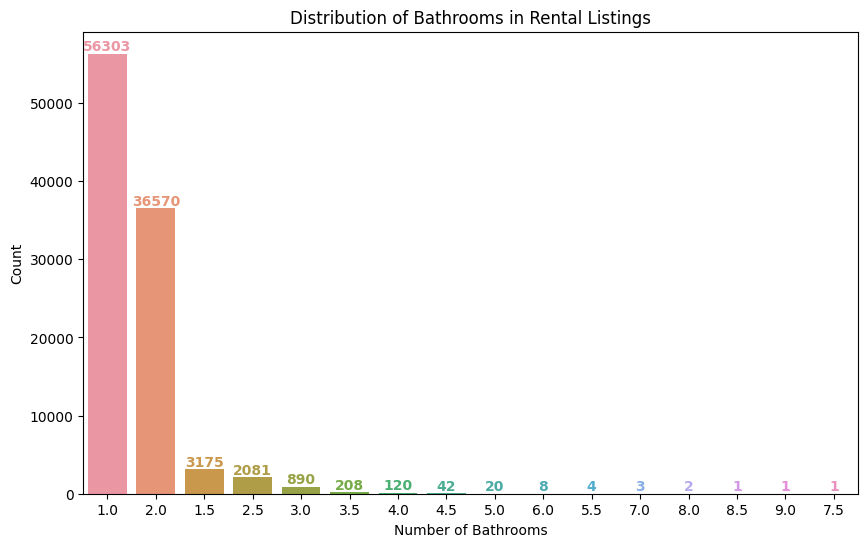

In [12]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='bathrooms', order=df['bathrooms'].value_counts().index)

# Add counts to each bar with the same color as the bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', 
                fontsize=10, color=p.get_facecolor(),  # Match text color to bar color
                weight='bold')  # Make the text bold for better readability

# Add labels and title
plt.xlabel('Number of Bathrooms')
plt.ylabel('Count')
plt.title('Distribution of Bathrooms in Rental Listings')

# Show the plot
plt.show()

rows with bathrooms greater than 5 should be removed as there is less values counts of bathrooms for those entries. 

# Data Cleaning

## Feature Removal

In [13]:
df.drop(columns=["id", "title", "body", "price_display", "currency", "address", "source"], inplace=True)

## Handling Missing Values

In [14]:
df.shape

(99492, 15)

In [15]:
for feat in ["amenities", "pets_allowed"]:
    df[feat] = df[feat].fillna("missing") # replacing missing values with "missing"

In [16]:
for feat in ["bedrooms", "bathrooms"]:
    df[feat] = df[feat].fillna(df[feat].median())

In [17]:
df = df.dropna() # remove every remaining row with any missing value

In [18]:
df.isnull().sum()

category        0
amenities       0
bathrooms       0
bedrooms        0
fee             0
has_photo       0
pets_allowed    0
price           0
price_type      0
square_feet     0
cityname        0
state           0
latitude        0
longitude       0
time            0
dtype: int64

In [19]:
df.shape

(99189, 15)

## Further Cleaning

In [20]:
df = df.query('bedrooms <= 6')
df = df.query('bathrooms <= 5')

In [21]:
df['bathrooms'] = df['bathrooms'].astype('int')
df['bedrooms'] = df['bedrooms'].astype('int')

In [22]:
df['fee'] = df['fee'].map({'No':0, 'Yes':1})

In [23]:
threshold = 100

# Replacing values below threshold with placeholder text
for feat in ["cityname", "state"]:
    counts = df[feat].value_counts()  # Get value counts
    to_keep = counts[counts >= threshold].index  # Filter for values with counts >= 100
    df[feat] = df[feat].where(df[feat].isin(to_keep), other='Other')  # Replace rare values with 'Other'

# Removing values below threshold with placeholder text
for feat in ["category", "has_photo", "price_type", "pets_allowed"]:
    counts = df[feat].value_counts()  # Get value counts
    to_keep = counts[counts >= threshold].index  # Filter for values with counts >= 100
    df = df[df[feat].isin(to_keep) | df[feat].isna()] # Keeping only rows wose value count is greater than threshold or value is NaN

In [24]:
# dropping resulting feature with a singlt unique value
df.drop(columns=["category", "price_type"], inplace=True)

In [25]:
# seperating multi-valued feature to separate columns
df = pd.concat([df, df['amenities'].str.get_dummies(sep=',').add_prefix('amenities_')], axis=1)
df = pd.concat([df, df['pets_allowed'].str.get_dummies(sep=',').add_prefix('pets_allowed_')], axis=1)

# dropping orignal columns
df.drop(columns=["amenities", "pets_allowed"], inplace=True)

In [26]:
df = df.query("price <= 8000")

In [27]:
df

,bathrooms,bedrooms,fee,has_photo,price,square_feet,cityname,state,latitude,longitude,time,amenities_AC,amenities_Alarm,amenities_Basketball,amenities_Cable or Satellite,amenities_Clubhouse,amenities_Dishwasher,amenities_Doorman,amenities_Elevator,amenities_Fireplace,amenities_Garbage Disposal,amenities_Gated,amenities_Golf,amenities_Gym,amenities_Hot Tub,amenities_Internet Access,amenities_Luxury,amenities_Parking,amenities_Patio/Deck,amenities_Playground,amenities_Pool,amenities_Refrigerator,amenities_Storage,amenities_TV,amenities_Tennis,amenities_View,amenities_Washer Dryer,amenities_Wood Floors,amenities_missing,pets_allowed_Cats,pets_allowed_Dogs,pets_allowed_missing
0,1,1,0,Thumbnail,2195.0,542,Other,CA,33.8520,-118.3759,1577360355,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1,1,3,0,Thumbnail,1250.0,1500,Newport News,VA,37.0867,-76.4941,1577360340,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0
2,2,3,0,Thumbnail,1395.0,1650,Raleigh,NC,35.8230,-78.6438,1577360332,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
3,1,2,0,Thumbnail,1600.0,820,Other,CA,38.3622,-121.9712,1577360330,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0
4,1,1,0,Thumbnail,975.0,624,Other,Other,35.1038,-106.6110,1577360308,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99487,1,1,0,Yes,780.0,605,Houston,TX,29.6151,-95.1998,1544185770,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,1,0,0,0,0,1,0,0,0,1
99488,2,2,0,Yes,813.0,921,Jacksonville,FL,30.2254,-81.7579,1544185750,1,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,1,1,1,1,1,1,1,0,0,1,0,0,1,1,0
99489,1,1,0,Yes,1325.0,650,San Diego,CA,32.7379,-117.0914,1544185729,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0
99490,1,1,0,Yes,931.0,701,Other,NC,35.4158,-80.8451,1544185670,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0


# EDA

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


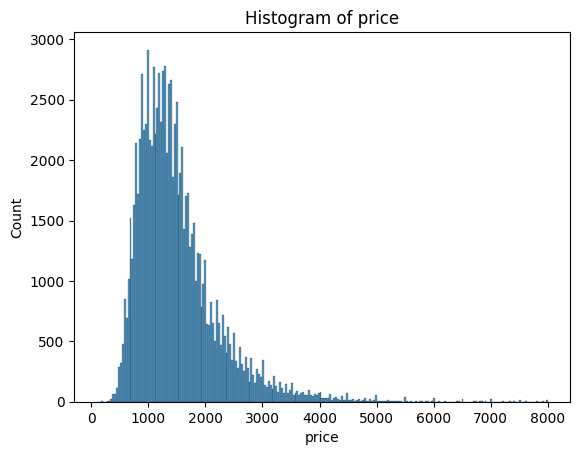

In [28]:
sns.histplot(df['price'])
plt.title('Histogram of price')
plt.show()

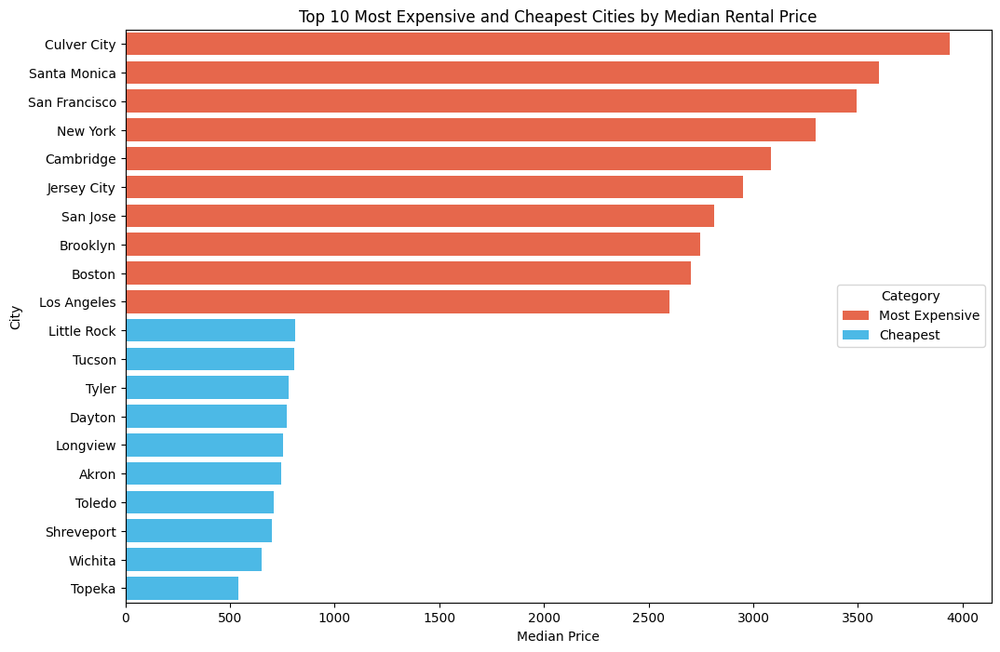

In [29]:
city_prices = df.groupby('cityname')['price'].median()

# Get the top 10 most expensive and cheapest cities
top_10_expensive = city_prices.nlargest(10)
top_10_cheapest = city_prices.nsmallest(10)

# Combine the two series into one DataFrame and sort by price in descending order
top_cities = pd.concat([top_10_expensive, top_10_cheapest]).reset_index()
top_cities['Category'] = ['Most Expensive'] * 10 + ['Cheapest'] * 10
top_cities = top_cities.sort_values(by='price', ascending=False)

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(data=top_cities, x='price', y='cityname', hue='Category', dodge=False, palette=['#FF5733', '#33C3FF'])

# Adding labels and title
plt.xlabel('Median Price')
plt.ylabel('City')
plt.title('Top 10 Most Expensive and Cheapest Cities by Median Rental Price')

# Show plot
plt.show()


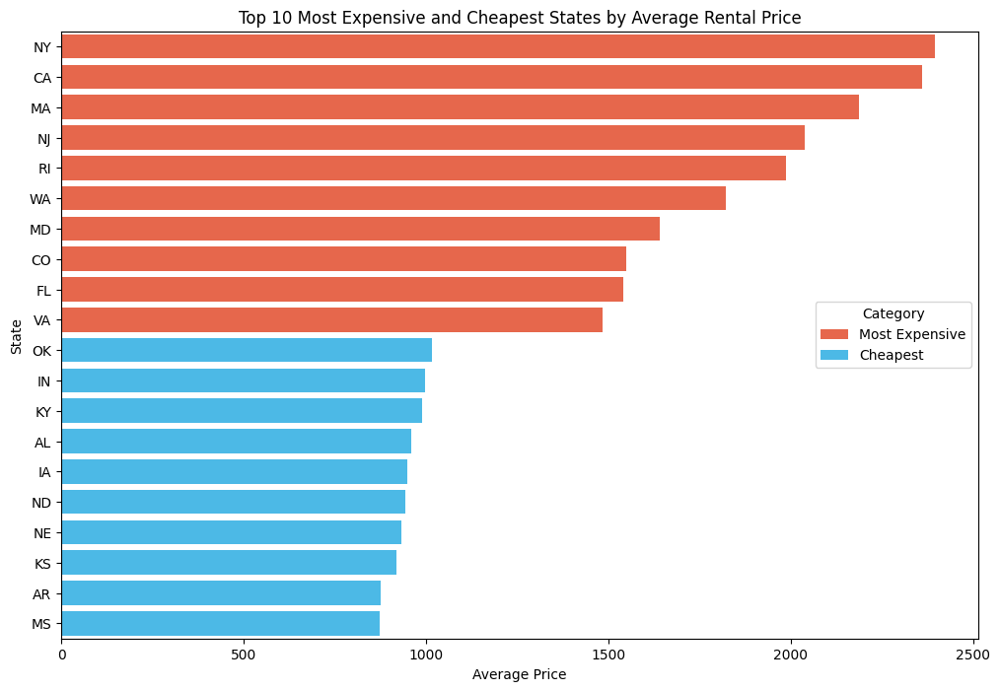

In [30]:
state_prices = df.groupby('state')['price'].mean()

# Get the top 10 most expensive and cheapest states
top_10_expensive_states = state_prices.nlargest(10)
top_10_cheapest_states = state_prices.nsmallest(10)

# Combine the two series into one DataFrame and sort by price in descending order
top_states = pd.concat([top_10_expensive_states, top_10_cheapest_states]).reset_index()
top_states['Category'] = ['Most Expensive'] * 10 + ['Cheapest'] * 10
top_states = top_states.sort_values(by='price', ascending=False)

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(data=top_states, x='price', y='state', hue='Category', dodge=False, palette=['#FF5733', '#33C3FF'])

# Adding labels and title
plt.xlabel('Average Price')
plt.ylabel('State')
plt.title('Top 10 Most Expensive and Cheapest States by Average Rental Price')

# Show plot
plt.show()

In [31]:
# Create a scatter map
fig = px.scatter_mapbox(
    df,
    lat='latitude',
    lon='longitude',
    color='price',
    hover_name='price',
    mapbox_style='carto-positron',
    zoom=3,
    height=600
)

# Show the figure in the Jupyter notebook
fig.show()


# Feature Engineering

In [32]:
# df['squarefeet_per_room'] = df['square_feet'] / (df['bedrooms']+df['bathrooms'])      
# df['squarefeet_per_room'] = df['squarefeet_per_room'].astype('float')

# df['is_northern'] = df['latitude'] >= 0
# df['is_northern'] = df['is_northern'].astype('int')

In [33]:
class FeatureEngineer(BaseEstimator, TransformerMixin):
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.copy()
        
        X['squarefeet_per_room'] = X['square_feet'] / (X['bedrooms']+X['bathrooms'])   
        X['squarefeet_per_room'] = X['squarefeet_per_room'].astype('float')
        
        X['is_northern'] = X['latitude'] >= 0
        X['is_northern'] = X['is_northern'].astype('int')

        X['is_western'] = X['longitude'] <= 0
        X['is_western'] = X['is_western'].astype('int')
        
        return X

# Preprocessing Pipeline

In [34]:
categorical_cols = df.select_dtypes('object').columns.to_list()

preprocessor = Pipeline(steps=[
    ('feature_engineer', FeatureEngineer()),
    ('column_transformer', ColumnTransformer(
        transformers=[
            ('onehot', OneHotEncoder(sparse_output=False, handle_unknown='ignore', dtype=np.int8), make_column_selector(dtype_include=['object', 'category'])),  
            ('scaler', StandardScaler(), make_column_selector(dtype_include=np.number)),
        ],
        remainder='passthrough'  # Keep the other columns as they are
    ))
])

# Supervised Prediction

## Data Splitting & Processing

In [35]:
X = df.drop(columns='price')
y = df['price']

In [36]:
random_state = 11
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.15, random_state=random_state)
X_test, X_valid, y_test, y_valid = train_test_split(X_temp, y_temp, test_size=0.35, random_state=random_state)

In [37]:
X_train.shape, X_test.shape, X_valid.shape

((84135, 41), (9651, 41), (5197, 41))

In [38]:
preprocessor.fit(X_train)

X_train_processed = preprocessor.transform(X_train)
X_test_processed = preprocessor.transform(X_test)
X_valid_processed = preprocessor.transform(X_valid)

In [39]:
X_train_processed.shape, X_test_processed.shape, X_valid_processed.shape

((84135, 299), (9651, 299), (5197, 299))

## Model 1 - RandomForest

In [40]:
scores = []
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_index, val_index in kf.split(X_train_processed):
    X_train_fold, X_val_fold = X_train_processed[train_index], X_train_processed[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    model = cuRandomForestRegressor(n_streams=1, random_state=42)
    
    # Train and predict
    model.fit(X_train_fold.astype(np.float32), y_train_fold.astype(np.float32))

    y_pred = model.predict(X_test_processed)
    score = r2_score(y_test, y_pred)
    scores.append(score)

In [41]:
print(f"RandomForest R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

RandomForest R^2 scores: [0.6020327716185644, 0.6031688649115324, 0.6000577578009607, 0.6021347606652095, 0.6040356321954996], Mean Score: 0.6023


## Model 2 - SVR

In [42]:
scores = []
for train_index, val_index in kf.split(X_train_processed):
    X_train_fold, X_val_fold = X_train_processed[train_index], X_train_processed[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    model = cuSVR()
    
    # Train and predict
    model.fit(X_train_fold, y_train_fold)

    y_pred = model.predict(X_test_processed)
    score = r2_score(y_test, y_pred)
    scores.append(score)

In [43]:
print(f"SVR R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

SVR R^2 scores: [0.14928166960012168, 0.14894986700911528, 0.14837530439888946, 0.15042217561567717, 0.15044481207406657], Mean Score: 0.1495


## Model 3 - Linear Regression

In [44]:
scores = []
for train_index, val_index in kf.split(X_train_processed):
    X_train_fold, X_val_fold = X_train_processed[train_index], X_train_processed[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    model = cuLinearRegression(copy_X=True)
    
    # Train and predict
    model.fit(X_train_fold, y_train_fold)

    y_pred = model.predict(X_test_processed)
    score = r2_score(y_test, y_pred)
    scores.append(score)

In [45]:
print(f"LinearRegression R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

LinearRegression R^2 scores: [0.645873003216649, 0.6467367652143257, 0.6455222016979646, 0.6463058087057799, 0.6455140086643087], Mean Score: 0.6460


## Model 4 - XGBoost

In [46]:
scores = []
for train_index, val_index in kf.split(X_train_processed):
    X_train_fold, X_val_fold = X_train_processed[train_index], X_train_processed[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    model = XGBRegressor(device='cuda', tree_method="hist", random_state=42)
    
    # Train and predict
    model.fit(X_train_fold, y_train_fold, eval_set=[(X_val_fold, y_val_fold)])

    y_pred = model.predict(X_test_processed)
    score = r2_score(y_test, y_pred)
    scores.append(score)

[0]	validation_0-rmse:616.45386
[1]	validation_0-rmse:541.23962
[2]	validation_0-rmse:488.39347
[3]	validation_0-rmse:459.85173
[4]	validation_0-rmse:437.55021
[5]	validation_0-rmse:422.98016
[6]	validation_0-rmse:412.76286
[7]	validation_0-rmse:404.81652
[8]	validation_0-rmse:399.12584
[9]	validation_0-rmse:394.56190
[10]	validation_0-rmse:388.56837
[11]	validation_0-rmse:385.99918
[12]	validation_0-rmse:383.06107
[13]	validation_0-rmse:378.04541
[14]	validation_0-rmse:372.62151
[15]	validation_0-rmse:369.36396
[16]	validation_0-rmse:368.21731
[17]	validation_0-rmse:365.64056
[18]	validation_0-rmse:363.29992
[19]	validation_0-rmse:361.71300
[20]	validation_0-rmse:357.94955
[21]	validation_0-rmse:356.05515
[22]	validation_0-rmse:353.91149
[23]	validation_0-rmse:351.70839
[24]	validation_0-rmse:350.87550
[25]	validation_0-rmse:350.09894
[26]	validation_0-rmse:347.98635
[27]	validation_0-rmse:346.32352
[28]	validation_0-rmse:345.85098
[29]	validation_0-rmse:344.95391
[30]	validation_0-rm

/opt/conda/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning:

[07:55:41] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.




[0]	validation_0-rmse:607.36722
[1]	validation_0-rmse:531.32076
[2]	validation_0-rmse:482.84585
[3]	validation_0-rmse:454.42781
[4]	validation_0-rmse:433.78035
[5]	validation_0-rmse:419.28823
[6]	validation_0-rmse:408.91142
[7]	validation_0-rmse:402.66170
[8]	validation_0-rmse:395.54863
[9]	validation_0-rmse:391.12298
[10]	validation_0-rmse:387.83747
[11]	validation_0-rmse:385.79203
[12]	validation_0-rmse:384.06531
[13]	validation_0-rmse:380.91298
[14]	validation_0-rmse:379.35734
[15]	validation_0-rmse:377.63919
[16]	validation_0-rmse:370.88208
[17]	validation_0-rmse:366.86325
[18]	validation_0-rmse:364.99364
[19]	validation_0-rmse:363.00319
[20]	validation_0-rmse:360.89646
[21]	validation_0-rmse:359.69584
[22]	validation_0-rmse:358.78225
[23]	validation_0-rmse:357.69980
[24]	validation_0-rmse:356.16629
[25]	validation_0-rmse:354.70013
[26]	validation_0-rmse:354.18204
[27]	validation_0-rmse:351.99012
[28]	validation_0-rmse:351.13060
[29]	validation_0-rmse:348.80797
[30]	validation_0-rm

In [47]:
print(f"XGB R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

XGB R^2 scores: [0.8080191709677231, 0.8051629206184068, 0.8054512275489589, 0.8060235272382421, 0.8007483448752166], Mean Score: 0.8051


## Model 5 - LGBM

In [48]:
scores = []
for train_index, val_index in kf.split(X_train_processed):
    X_train_fold, X_val_fold = X_train_processed[train_index], X_train_processed[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    model = LGBMRegressor(device='gpu', metric="r2", verbosity=-1, random_state=42)
    
    # Train and predict
    model.fit(X_train_fold, y_train_fold, eval_set=[(X_val_fold, y_val_fold)])

    y_pred = model.predict(X_test_processed)
    score = r2_score(y_test, y_pred)
    scores.append(score)

1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.


In [49]:
print(f"LGBM R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

LGBM R^2 scores: [0.7813532384280846, 0.7892545810559459, 0.7895460424601903, 0.7829014892206421, 0.785176119288546], Mean Score: 0.7856


## Model 6 - CatBoost

In [50]:
X = df.drop(columns='price')
y = df['price']

In [51]:
random_state = 77
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=random_state)

In [52]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Assuming X_train and y_train are defined
cat_features = X_train.select_dtypes('object').columns.to_list()
scores = []
best_cb_score, best_cb_model = 0, None

for train_index, val_index in kf.split(X_train):
    # Use .iloc for positional indexing
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Initialize CatBoostRegressor
    model = CatBoostRegressor(task_type='GPU', devices='0', eval_metric='R2', verbose=0, random_state=42)

    # Train and predict
    model.fit(X_train_fold, y_train_fold, eval_set=[(X_val_fold, y_val_fold)], cat_features=cat_features)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Calculate the score and append to the scores list
    score = r2_score(y_test, y_pred)
    
    if score > best_cb_score:
        best_cb_score, best_cb_model = score, model
        
    scores.append(score)

Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Default metric period is 5 because R2 is/are not implemented for GPU
Metric R2 is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


In [53]:
print(f"CatBoost R^2 scores: {scores}, Mean Score: {np.mean(scores):.4f}")

CatBoost R^2 scores: [0.8101979279626192, 0.8096100896722394, 0.8088986452299344, 0.8086081507019376, 0.8092248955949328], Mean Score: 0.8093


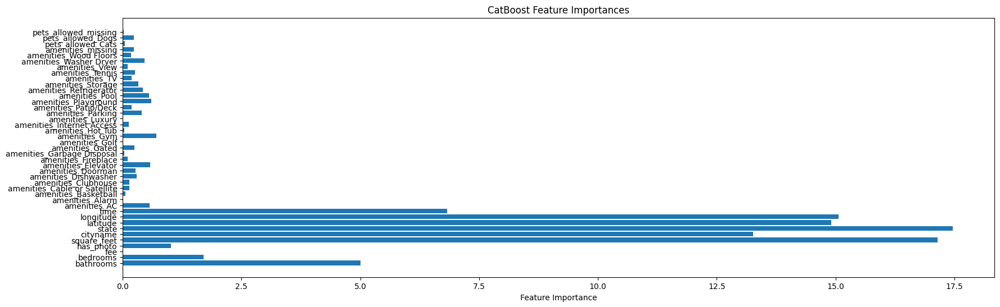

In [54]:
# Get feature importances
feature_importances = best_cb_model.get_feature_importance()

# Get feature names directly from the DataFrame columns
feature_names = df.drop(columns='price').columns

# Create a horizontal bar plot
plt.figure(figsize=(20, 6))
plt.barh(feature_names, feature_importances)
plt.xlabel('Feature Importance')
plt.title('CatBoost Feature Importances')
plt.show()

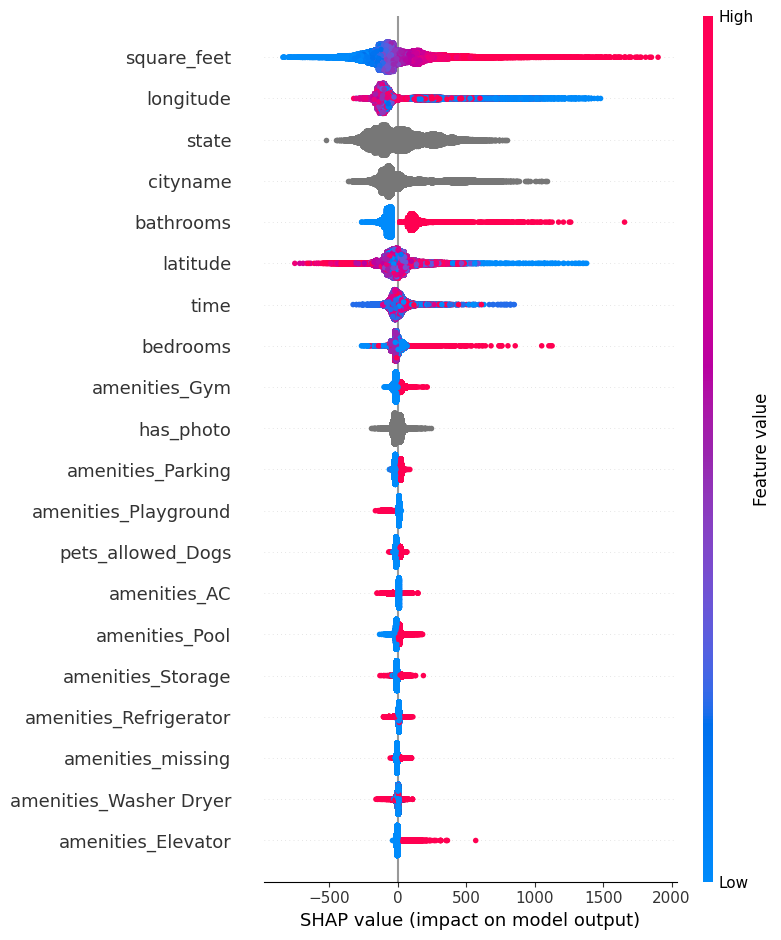

In [55]:
explainer = shap.Explainer(best_cb_model)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

## Inference Function

In [56]:
best_cb_model.save_model('catboost_model.cbm')

In [57]:
import datetime

def datetime_converter(date_string: str):
    '''
    Example input = "2020-01-01 12:00:00"
    '''
    normal_date_time = datetime.datetime.strptime(date_string, '%Y-%m-%d %H:%M:%S') # Parse the string to a datetime object
    unix_timestamp = int(normal_date_time.timestamp()) # Convert to Unix timestamp
    return unix_timestamp

input_info = {
    'bathrooms': X['bathrooms'].unique().tolist(),
    'bedrooms': X['bedrooms'].unique().tolist(),
    'fee': X['fee'].unique().tolist(),
    'has_photo': X['has_photo'].unique().tolist(),
    'square_feet': range(min(X['square_feet']), max(X['square_feet'])),
    'cityname': X['cityname'].unique().tolist(),
    'state': X['state'].unique().tolist(),
    'latitude': range(-90, 90),
    'longitude': range(-180, 180),
    'time': datetime_converter,
    'amenities': [col.replace('amenities_', '') for col in df.columns[df.columns.str.startswith('amenities')]],
    'pets': [col.replace('pets_allowed_', '') for col in df.columns[df.columns.str.startswith('pets')]]
}

def housing_prediction(
    bathrooms: int,
    bedrooms: int,
    fee: int,
    has_photo : str,
    square_feet: float,
    cityname: str,
    state: str,
    latitude: int,
    longitude: int,
    time: str,
    amenities: list[str],
    pets: list[str]
):
    array = [bathrooms, bedrooms, fee, has_photo, square_feet, cityname, state, latitude, longitude, input_info['time'](time)]
    
    for am in input_info['amenities']:
        if am in amenities:
            array.append(1)
        else:
            array.append(0)
            
    for pet in input_info['pets']:
        if pet in pets:
            array.append(1)
        else:
            array.append(0)
    
    predicted_price = best_cb_model.predict(array)
    
    return f'Predicted price is ${predicted_price:.3f} per month.' 
    
housing_prediction(
    bathrooms = 1,
    bedrooms = 2,
    fee = 1,
    has_photo = 'Yes',
    square_feet = 40000.0,
    cityname = 'Raleigh',
    state = 'AL',
    latitude = -80,
    longitude = 110,
    time = "2020-01-01 12:00:00",
    amenities = ['AC', 'Alarm', 'Basketball'],
    pets = ['Cats', 'Dogs']
)

'Predicted price is $2328.901 per month.'

In [78]:
input_info

{'bathrooms': [1, 2, 3, 4, 5],
 'bedrooms': [1, 3, 2, 4, 0, 5, 6],
 'fee': [0, 1],
 'has_photo': ['Thumbnail', 'No', 'Yes'],
 'square_feet': range(101, 40000),
 'cityname': ['Other',
  'Newport News',
  'Raleigh',
  'Hampton',
  'Lakewood',
  'Charleston',
  'Alpharetta',
  'Washington',
  'Scottsdale',
  'Kirkland',
  'San Antonio',
  'Portland',
  'Austin',
  'Kansas City',
  'Pittsburgh',
  'San Jose',
  'Madison',
  'Concord',
  'Arlington',
  'Alexandria',
  'Dallas',
  'Chicago',
  'Orlando',
  'Lafayette',
  'Sacramento',
  'Jacksonville',
  'Boulder',
  'Owings Mills',
  'Saint Petersburg',
  'Houston',
  'Saint Louis',
  'Kent',
  'Oklahoma City',
  'Nashville',
  'Omaha',
  'Grand Forks',
  'Philadelphia',
  'Cincinnati',
  'Edmond',
  'College Station',
  'Tucson',
  'Bellevue',
  'Atlanta',
  'Tampa',
  'Federal Way',
  'Baltimore',
  'Lithonia',
  'Birmingham',
  'Long Beach',
  'San Francisco',
  'Columbia',
  'Davenport',
  'Glendale',
  'Peoria',
  'Columbus',
  'Morris

In [58]:
my_range = range(1, 10)
isinstance(my_range, range)

True

In [59]:
start_value = my_range.start  # Get the start value
end_value = my_range.stop      # Get the stop value (exclusive)
print(f"Start value: {start_value}")  # Output: Start value: 1
print(f"End value: {end_value}")      # Output: End value: 10

Start value: 1
End value: 10


In [60]:
for feat, val in input_info.items():
    if callable(val):
        print(feat)
        break

time


# Unsupervised Prediction

## Data Processing

In [61]:
df_processed = preprocessor.fit_transform(df)

In [62]:
df_processed.shape

(98983, 300)

## Model 7 - KMeans

### Elbow & Silhouette Score Method

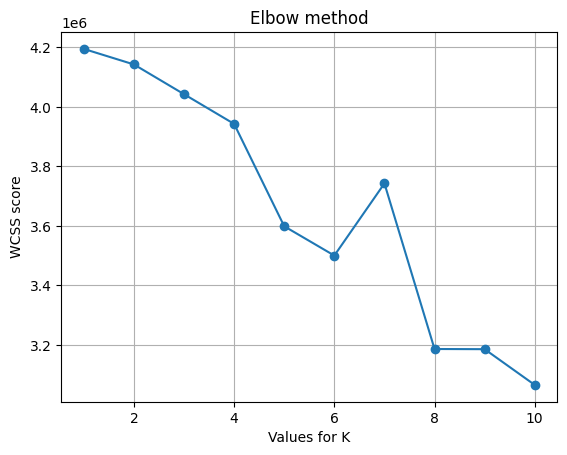

In [63]:
wcss_scores = []

for k_value in range(1, 11):
    kmeans = KMeans(n_clusters=k_value)
    kmeans.fit(cp.asarray(df_processed))
    wcss = kmeans.inertia_
    wcss_scores.append(wcss)
    
plt.plot(list(range(1, 11)), wcss_scores, marker='o')
plt.title('Elbow method')
plt.ylabel('WCSS score')
plt.xlabel('Values for K')
plt.grid()
plt.show()

1
2
3
4
5
6
7
8
9


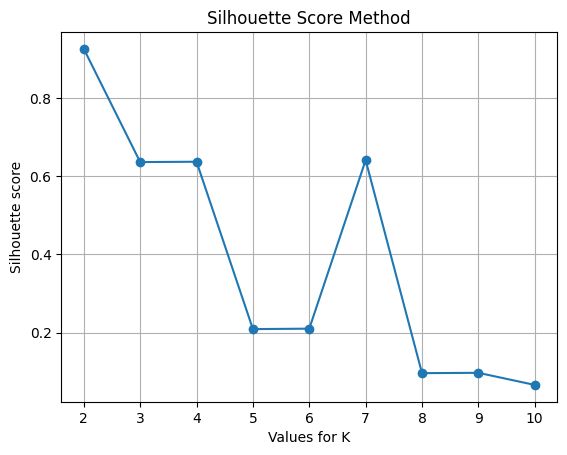

In [66]:
ss_scores = []

for k_value in range(2, 11):
    kmeans = KMeans(n_clusters=k_value)
    kmeans.fit(cp.asarray(df_processed))
    print(k_value-1)
    
    pred_clusters = kmeans.predict(cp.asarray(df_processed))
    
    ss = silhouette_score(df_processed, pred_clusters)
    ss_scores.append(ss)

plt.plot(list(range(2, 11)), ss_scores, marker='o')
plt.title('Silhouette Score Method')
plt.ylabel('Silhouette score')
plt.xlabel('Values for K')
plt.grid()
plt.show()

Best number of clusters is 2

### Clustering

In [67]:
kmeans = KMeans(n_clusters=2)
clusters = kmeans.fit_predict(cp.asarray(df_processed))

In [68]:
df_clusters = pd.DataFrame(df, columns=['latitude', 'longitude'])
df_clusters['cluster'] = cp.asnumpy(clusters)

In [69]:
# Create a scatter map
fig = px.scatter_mapbox(
    df_clusters,
    lat='latitude',
    lon='longitude',
    color='cluster',
    hover_name='cluster',
    mapbox_style='carto-positron',
    zoom=3,
    height=600
)

# Show the figure in the Jupyter notebook
fig.show()


## Model 8 - DBSCAN

In [70]:
# Fit DBSCAN
dbscan = DBSCAN(eps=3, min_samples=6) 
pred_clusters = dbscan.fit_predict(cp.asarray(df_processed))

[W] [08:33:32.022686] Batch size limited by the chosen integer type (4 bytes). 25103 -> 21695. Using the larger integer type might result in better performance


In [71]:
# Create a DataFrame for plotting
df_clusters = pd.DataFrame(df, columns=['latitude', 'longitude'])
df_clusters['cluster'] = cp.asnumpy(pred_clusters)

In [72]:
# Create a scatter map
fig = px.scatter_mapbox(
    df_clusters,
    lat='latitude',
    lon='longitude',
    color='cluster',
    hover_name='cluster',
    mapbox_style='carto-positron',
    zoom=3,
    height=600
)

# Show the figure in the Jupyter notebook
fig.show()

In [73]:
fig = px.scatter_3d(df, x='latitude', y='longitude', z='price', color=df_clusters['cluster'])
fig.update_traces(marker=dict(size=2))
fig.update_layout(
    title="DBSCAN Clusters Visualization of Rental Listings",
    scene=dict(
        xaxis_title="Latitude",
        yaxis_title="Longitude",
        zaxis_title="Price"
    )
)
fig.show()

## Model 9 - PCA

In [74]:
pca = PCA(n_components=2)
components_pca = pca.fit_transform(df_processed)

pca.explained_variance_ratio_

array([0.12141105, 0.05989228])

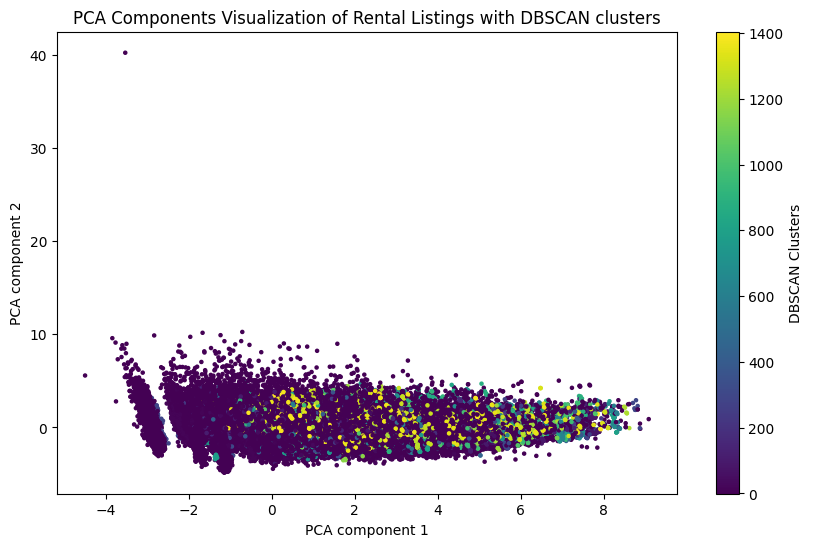

In [75]:
plt.figure(figsize=(10, 6))
plt.scatter(components_pca[:, 0], components_pca[:, 1], c=df_clusters['cluster'], cmap='viridis', s=5)  # Color by price or another feature
plt.colorbar(label='DBSCAN Clusters')
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.title("PCA Components Visualization of Rental Listings with DBSCAN clusters")
plt.show()

## Model 10 - t-SNE

In [76]:
# from sklearn.manifold import TSNE
from cuml.manifold import TSNE

perplexity = 30
n_neighbors = 4 * perplexity

tsne = TSNE(n_components=2, perplexity=perplexity, n_neighbors=n_neighbors, method='fft', learning_rate=200, n_iter=1000, random_state=0)
X_embedded = tsne.fit_transform(df_processed)
X_embedded = cp.asnumpy(X_embedded)


/opt/conda/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning:

Starting from version 22.04, the default method of TSNE is 'fft'.



[W] [08:35:07.617813] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


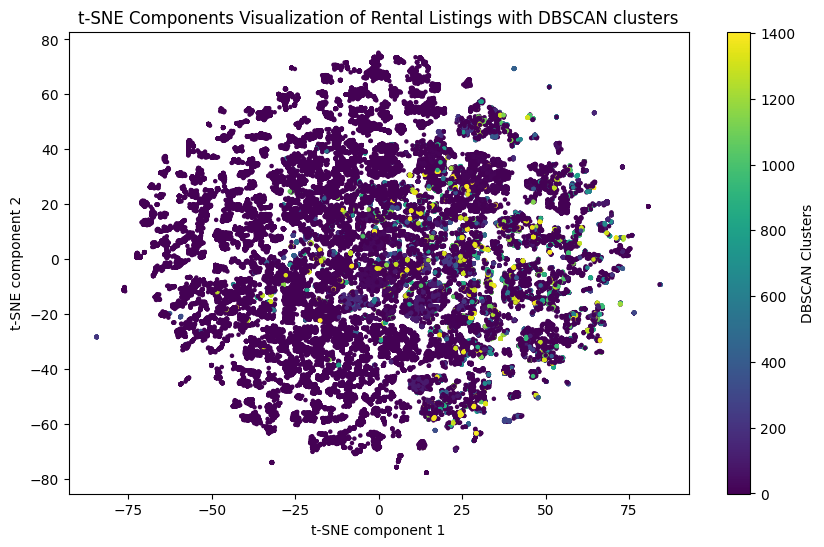

In [77]:
plt.figure(figsize=(10, 6))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=df_clusters['cluster'], cmap='viridis', s=5)  # Color by price or another feature
plt.colorbar(label='DBSCAN Clusters')
plt.xlabel("t-SNE component 1")
plt.ylabel("t-SNE component 2")
plt.title("t-SNE Components Visualization of Rental Listings with DBSCAN clusters")
plt.show()